In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

import torch
from torch import nn
from torch.nn import functional as f
from torch.utils.data import TensorDataset, DataLoader


import math
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


from matplotlib import pyplot as plt

import os
from torchvision.datasets import MNIST
from torchvision import transforms as tfs
from torch.utils.data import Dataset

from torch.optim import lr_scheduler
from IPython.display import clear_output

from matplotlib import pyplot as plt
%matplotlib inline
# КРАСИВЫЕ ГРАФИКИ - КАК СИМВОЛ ПОБЕДЫ, ВЕКТОРНАЯ ПРОРИСОВКА - КАК ОРУДИЕ ВОЙНЫ
%config InlineBackend.figure_format = 'svg' 

device = "cuda" if torch.cuda.is_available() else "cpu"

%load_ext autoreload
%autoreload 2

In [2]:


normal_data = pd.read_csv('Normal_data.csv')
anomaly_data = pd.read_csv('Anomaly_data.csv')

In [3]:
normal_data = normal_data.drop('Unnamed: 0', axis=1)
anomaly_data = anomaly_data.drop('Unnamed: 0', axis=1)

In [4]:
normal_data.dtypes

FIT101     float64
LIT101     float64
AIT201     float64
AIT202     float64
AIT203     float64
FIT201     float64
DPIT301    float64
FIT301     float64
LIT301     float64
AIT401     float64
AIT402     float64
FIT401     float64
LIT401     float64
AIT501     float64
AIT502     float64
AIT503     float64
AIT504     float64
FIT501     float64
FIT502     float64
FIT503     float64
FIT504     float64
PIT501     float64
PIT502     float64
PIT503     float64
FIT601     float64
MV101        int64
P101         int64
P102         int64
MV201        int64
P201         int64
P202         int64
P203         int64
P204         int64
P205         int64
P206         int64
MV301        int64
MV302        int64
MV303        int64
MV304        int64
P301         int64
P302         int64
P401         int64
P402         int64
P403         int64
P404         int64
UV401        int64
P501         int64
P502         int64
P601         int64
P602         int64
P603         int64
dtype: object

In [5]:
normal_data

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,P401,P402,P403,P404,UV401,P501,P502,P601,P602,P603
0,0.000000,124.372375,251.9226,8.313446,312.79160,0.000000,2.560983,0.000256,138.666350,0.000,...,1,1,1,1,1,1,1,1,1,1
1,0.000000,124.333125,251.9226,8.313286,312.79160,0.000000,2.560983,0.000256,138.586300,0.000,...,1,1,1,1,1,1,1,1,1,1
2,0.000000,124.254575,251.9226,8.309200,312.79160,0.000000,2.560983,0.000256,138.135675,0.000,...,1,1,1,1,1,1,1,1,1,1
3,0.000000,124.097600,251.9226,8.311844,312.79160,0.000000,2.560983,0.000256,137.905300,0.000,...,1,1,1,1,1,1,1,1,1,1
4,0.000000,124.156500,251.9226,8.309921,312.91980,0.000000,2.560983,0.000256,137.905300,0.000,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49495,2.449797,516.782200,261.2791,8.388426,329.80005,2.442828,19.773990,2.202863,869.789000,148.808,...,1,2,1,1,2,2,1,1,1,1
49496,2.449797,516.782200,261.2791,8.388426,329.80005,2.442828,19.773990,2.202991,869.789000,148.808,...,1,2,1,1,2,2,1,1,1,1
49497,2.449717,516.782200,261.2791,8.388426,329.80005,2.442828,19.780400,2.202991,869.789000,148.808,...,1,2,1,1,2,2,1,1,1,1
49498,2.450117,516.782200,261.2791,8.388426,329.80005,2.442828,19.780400,2.202991,869.789000,148.808,...,1,2,1,1,2,2,1,1,1,1


In [6]:
anomaly_data

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,P402,P403,P404,UV401,P501,P502,P601,P602,P603,Normal/Attack
0,2.500481,522.905625,262.0161,8.394514,328.6337,2.443726,19.69076,2.208532,956.565625,148.8080,...,2,1,1,2,2,1,1,1,1,0
1,2.606812,523.464975,262.0161,8.394514,328.6337,2.441803,19.69076,2.209525,957.226525,148.8080,...,2,1,1,2,2,1,1,1,1,0
2,2.551164,522.984125,262.0161,8.390669,328.6337,2.441803,19.69076,2.208628,957.677200,148.8080,...,2,1,1,2,2,1,1,1,1,0
3,2.555328,523.690650,262.0161,8.390669,328.6337,2.439881,19.68756,2.210005,957.777300,148.8080,...,2,1,1,2,2,1,1,1,1,0
4,2.565177,524.073400,262.0161,8.390669,328.6337,2.439881,19.68756,2.209653,958.037625,148.8080,...,2,1,1,2,2,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44979,2.493995,511.914850,168.9310,8.616894,307.9980,2.458719,20.36302,2.197098,865.863750,148.8032,...,2,1,1,2,2,1,1,1,1,0
44980,2.493995,511.914850,168.9310,8.616894,307.9980,2.458751,20.36302,2.197098,865.863750,148.8032,...,2,1,1,2,2,1,1,1,1,0
44981,2.493995,511.914850,168.9310,8.616894,307.9980,2.458847,20.36302,2.197098,865.863750,148.8032,...,2,1,1,2,2,1,1,1,1,0
44982,2.493835,511.914850,168.9310,8.616894,307.9980,2.458847,20.36302,2.197098,865.863750,148.8032,...,2,1,1,2,2,1,1,1,1,0


In [7]:
state = anomaly_data['Normal/Attack']
anomaly_data = anomaly_data.drop('Normal/Attack', axis=1)

In [8]:
state = np.array(state)

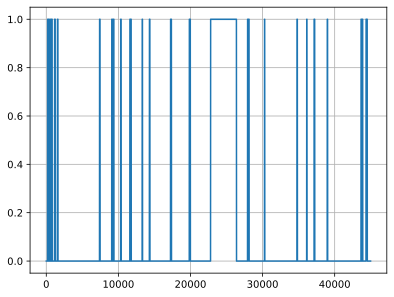

In [9]:
plt.plot(state)
plt.grid()

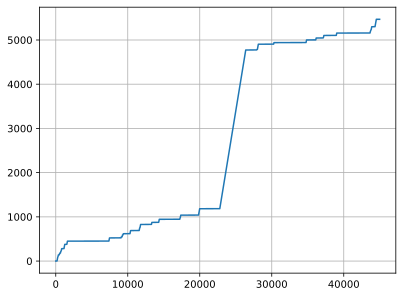

In [10]:
plt.plot(state.cumsum())
plt.grid()

In [11]:
np.unique(state.cumsum()[1:][state.cumsum()[: -1] == state.cumsum()[1: ]])

array([   0,   94,  139,  178,  217,  237,  280,  377,  450,  523,  546,
        590,  618,  689,  715,  754,  827,  874,  944,  976, 1038, 1183,
       4773, 4786, 4904, 4940, 5000, 5044, 5054, 5102, 5156, 5202, 5230,
       5270, 5299, 5468])

In [12]:
anomaly_gaps = np.unique(state.cumsum()[1:][state.cumsum()[: -1] == state.cumsum()[1: ]])[1: ] - np.unique(state.cumsum()[1:][state.cumsum()[: -1] == state.cumsum()[1: ]])[: -1]

In [13]:
anomaly_gaps

array([  94,   45,   39,   39,   20,   43,   97,   73,   73,   23,   44,
         28,   71,   26,   39,   73,   47,   70,   32,   62,  145, 3590,
         13,  118,   36,   60,   44,   10,   48,   54,   46,   28,   40,
         29,  169])

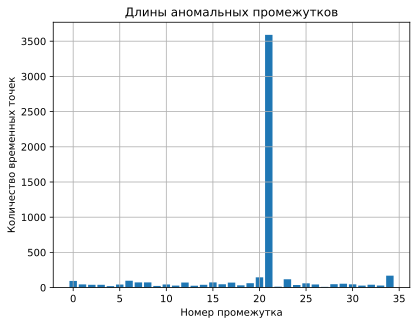

In [14]:
plt.title('Длины аномальных промежутков')
plt.bar(np.arange(len(anomaly_gaps)), anomaly_gaps)
plt.xlabel('Номер промежутка')
plt.ylabel('Количество временных точек')
plt.grid()

In [15]:
normal_data.columns

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', 'MV101', 'P101', 'P102',
       'MV201', 'P201', 'P202', 'P203', 'P204', 'P205', 'P206', 'MV301',
       'MV302', 'MV303', 'MV304', 'P301', 'P302', 'P401', 'P402', 'P403',
       'P404', 'UV401', 'P501', 'P502', 'P601', 'P602', 'P603'],
      dtype='object')

In [16]:
anomaly_data.columns

Index(['FIT101', 'LIT101', ' AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', ' MV101', 'P101', 'P102',
       ' MV201', ' P201', ' P202', 'P203', ' P204', 'P205', 'P206', 'MV301',
       'MV302', ' MV303', 'MV304', 'P301', 'P302', 'P401', 'P402', 'P403',
       'P404', 'UV401', 'P501', 'P502', 'P601', 'P602', 'P603'],
      dtype='object')

In [17]:
float_columns = ['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601']


In [18]:

anomaly_data.columns = normal_data.columns

In [19]:
float_idx = []
for i in float_columns:
    float_idx.append(normal_data.columns.get_loc(i))

In [20]:
float_idx = np.array(float_idx)

In [21]:
float_idx

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24])

In [22]:
scaler = StandardScaler()
normal_data[float_columns] = scaler.fit_transform(normal_data[float_columns])

In [23]:
anomaly_data[float_columns] = scaler.transform(anomaly_data[float_columns])

In [24]:
normal_data = np.array(normal_data)
anomaly_data = np.array(anomaly_data)

In [25]:
normal_data[:, float_idx].shape

(49500, 25)

In [26]:
normal_data[:, 25:][normal_data[:, 25:] == 1] = 0
normal_data[:, 25:][normal_data[:, 25:] == 2] = 1

anomaly_data[:, 25:][anomaly_data[:, 25:] == 1] = 0
anomaly_data[:, 25:][anomaly_data[:, 25:] == 2] = 1

In [27]:
prediction_columns = ['FIT101', 'LIT101', 'AIT501', 'MV101']

normal_data_check = pd.read_csv('Normal_data.csv')

prediction_idx = []
for i in prediction_columns:
    prediction_idx.append(normal_data_check.columns.get_loc(i))

prediction_idx = np.sort(prediction_idx) - 1

In [28]:
prediction_idx

array([ 0,  1, 13, 25])

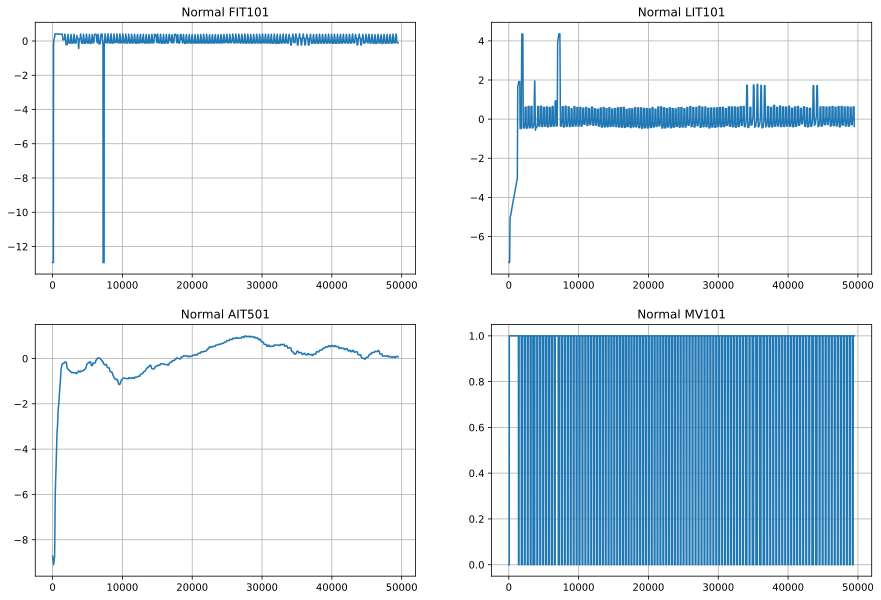

In [29]:
fig = plt.figure(figsize=(15, 10))
for i in range(4):
  fig.add_subplot(2, 2, i + 1)
  plt.plot(normal_data[:, prediction_idx[i]])
  plt.title('Normal ' + prediction_columns[i])
  plt.grid()


In [30]:
new_normal_data = normal_data.copy()
new_anomaly_data = anomaly_data.copy()

for i in range(normal_data.shape[0]):
  new_normal_data[i, prediction_idx[2]] -= normal_data[max(0, i - 500): i + 1, prediction_idx[2]].mean()

for i in range(anomaly_data.shape[0]):
  new_anomaly_data[i, prediction_idx[2]] -= anomaly_data[max(0, i - 500): i + 1, prediction_idx[2]].mean()

normal_data = new_normal_data
anomaly_data = new_anomaly_data

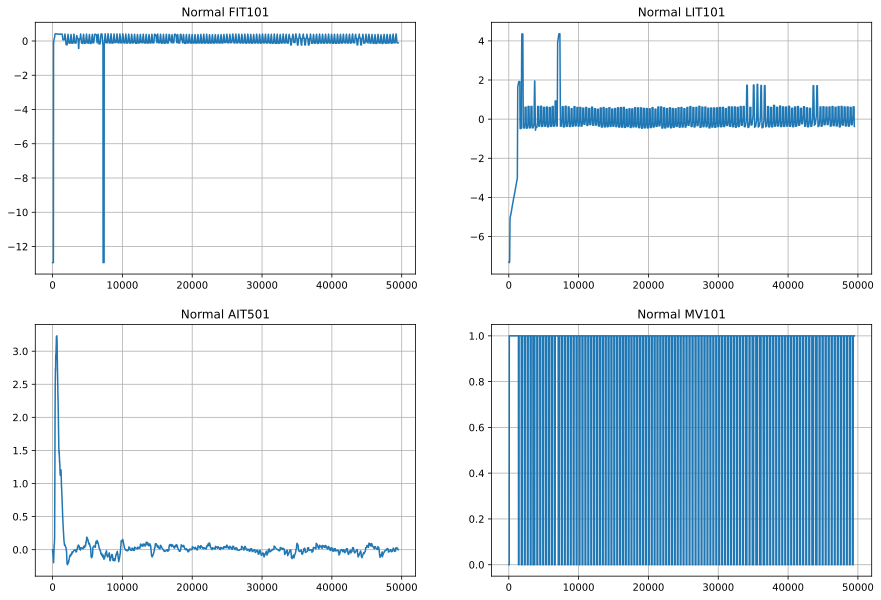

In [33]:
fig = plt.figure(figsize=(15, 10))
for i in range(4):
  fig.add_subplot(2, 2, i + 1)
  plt.plot(normal_data[:, prediction_idx[i]])
  plt.title('Normal ' + prediction_columns[i])
  plt.grid()


In [34]:
normal_data = normal_data[10000: ]
train_data = normal_data[: 31500]
test_data = normal_data[31500: ]

In [35]:
train_data.shape, test_data.shape

((31500, 51), (8000, 51))

In [36]:

class SWaT_Dataset_Autoformer_TCN(Dataset):
  def __init__(self, dataset, seq_len=96, classes=51):
    self.dataset = dataset
    self.len = dataset.shape[0] - seq_len 
    self.seq_len = seq_len
    self.classes = classes

  def __len__(self):
    return self.len

  def __getitem__(self, idx):
    x, y = self.dataset[idx: idx + self.seq_len], self.dataset[idx + 1: idx + self.seq_len + 1]
    return x.reshape(-1, self.classes), y.reshape(-1, self.classes)

In [37]:
def train_cycle_TCN(model, epochs, criterion_bin, criterion_float, optimizer, scheduler, loaders, device, clip=2):
  losses_bin = {'train': [], 'test': []}
  losses_float = {'train': [], 'test': []}
  figure, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))
  state = None
  best_loss = 10
  for epoch in range(epochs):
    for mode, dataloader in loaders.items():
      bin_los = []
      float_los = []
      total = 0

      for x_batch, y_batch in dataloader:
        if mode == 'train':
          model.train()
          optimizer.zero_grad()
          # y_batch: (B, pred_len, 4)
          # x_batch: (B, seq_len, 4)

          output = model(x_batch.to(device).float()).float()
          #output: (B, pred_len, classes)
          binary_output = output[:, :, -1]
          float_output = output[:, :, : 3]
          loss_bin = criterion_bin(binary_output, y_batch.to(device)[:, :, -1])
          loss_float = criterion_float(float_output, y_batch.to(device)[:, :, :3].float())
          print(loss_float.item(), 'Train:', epoch)
          #print('tr', loss.item(), output.shape)
          #loss_bin.backward(retain_graph=True)
          total += x_batch.shape[0] * x_batch.shape[1]
          loss = loss_bin + loss_float
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
          bin_los.append(loss_bin.item())
          float_los.append(loss_float.item())
          optimizer.step()
        else:
          model.eval()
          with torch.no_grad():
            #y_batch = y_batch[:, :, 4]
            output = model(x_batch.to(device).float()).float()
            #output: (B, pred_len, 4)
            binary_output = output[:, :, -1]
            float_output = output[:, :, : 3]
            loss_bin = criterion_bin(binary_output, y_batch.to(device)[:, :, -1])
            loss_float = criterion_float(float_output, y_batch.to(device)[:, :, :3].float())
            total += x_batch.shape[0] * x_batch.shape[1]

            print(loss_float.item(), 'Test:', epoch)

            bin_los.append(loss_bin.item())
            float_los.append(loss_float.item())

      if mode == 'test' and np.sum(float_los) / (total * 3) < best_loss:
        best_loss = np.sum(float_los) / (total * 3)
        state = model.state_dict()
        print('BEST EPOCH: ', epoch)
      losses_bin[mode].append(np.sum(bin_los) / total)
      losses_float[mode].append(np.sum(float_los) / (total * 3))

    ax1.set_xlim(0, epoch)
    ax1.cla()
    ax2.set_xlim(0, epoch)
    ax2.cla()
    clear_output(wait=True)
    ax1.plot(range(epoch + 1), losses_bin['train'], label='train', linestyle='dashed')
    ax1.plot(range(epoch + 1), losses_bin['test'], label='test', linestyle='solid')
    ax2.plot(range(epoch + 1), losses_float['train'], label='train', linestyle='dashed')
    ax2.plot(range(epoch + 1), losses_float['test'], label='test', linestyle='solid')
    ax1.set_xlabel('Epochs')
    ax2.set_xlabel('Epochs')
    ax1.set_ylabel('Loss_bin')
    ax2.set_ylabel('Loss_float')
    ax1.grid(True)
    ax2.grid(True)
    ax1.legend()
    ax2.legend()
    display(figure)
    if scheduler is not None:
      scheduler.step()
  return np.array(losses_bin['test']), np.array(losses_bin['train']), np.array(losses_float['test']), np.array(losses_float['train']), state

In [ ]:
train_check = SWaT_Dataset_Autoformer_TCN(train_data[:, prediction_idx], 400, 4)
test_check = SWaT_Dataset_Autoformer_TCN(test_data[:, prediction_idx], 400, 4)

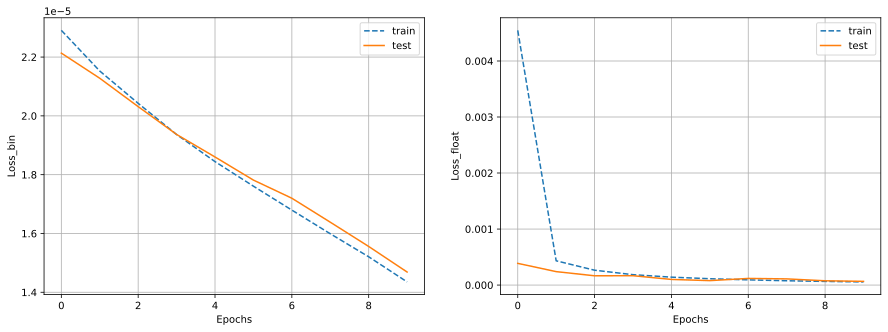

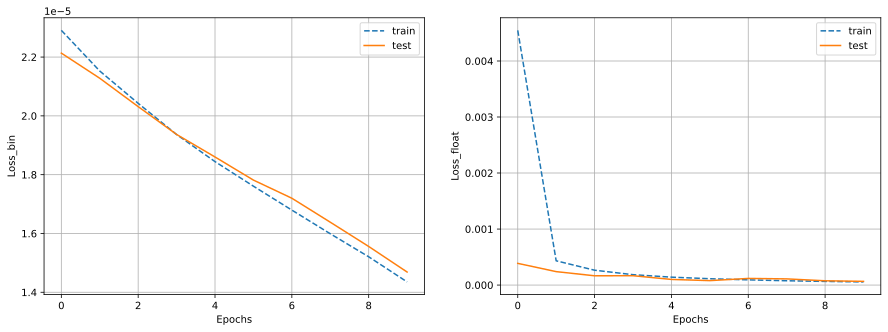

In [ ]:
from TCN import AutoRegressiveTCN

dropout = 0.1
kernel_size = 7
n = 8
hidden_channels = 128
r_seed = 42

input_channels = 4
n_classes = input_channels
channel_sizes = [hidden_channels] * n

device = "cuda" if torch.cuda.is_available() else "cpu"
model = AutoRegressiveTCN(input_channels, n_classes, channel_sizes, kernel_size=kernel_size, dropout=dropout).to(device)

lr = 1e-4
epochs = 10

batch_size = 64
train_dataloader = DataLoader(train_check, shuffle=True, batch_size=batch_size)
test_dataloader = DataLoader(test_check, shuffle=False, batch_size=batch_size)

criterion_bin = torch.nn.BCEWithLogitsLoss()
criterion_float = torch.nn.MSELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

loaders = {'train': train_dataloader, 'test': test_dataloader}
losses_bin_test, losses_bin_train, losses_float_test, losses_float_train, TCN_state = train_cycle_TCN(model, epochs, criterion_bin, criterion_float, optimizer, None, loaders, device)

In [ ]:
torch.save(TCN_state, 'TCN_SWaT')

In [ ]:
model.load_state_dict(torch.load('/content/TCN_SWaT'))

<All keys matched successfully>

In [ ]:
all = 0
for i in model.named_parameters():
  all += i[1].reshape(-1).shape[0]
  print(i[1].max())

print('Num of params: ', all)


tensor(0.1738, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.7507, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.2331, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0572, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6349, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.2142, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.3419, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.4996, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0342, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.7588, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1796, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0332, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6956, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1300, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0367, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.7528, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1419, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0342, device='cuda:0', grad_fn=<MaxBack

In [ ]:
losses_float_test

array([3.86998796e-04, 2.39341335e-04, 1.65180235e-04, 1.66498342e-04,
       1.00084267e-04, 7.86725654e-05, 1.17904456e-04, 1.09822147e-04,
       7.60219227e-05, 6.57831840e-05])

In [ ]:
r = []
g = []
x, y = test_check[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :]
for i in range(50):
  _, y = test_check[i]
  result = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  if result[0, -1, -1] > 0:
    result[0, -1, -1] = 1
  else:
    result[0, -1, -1] = 0
  x = torch.cat((x, result[0, -1, :][None, None, :]), dim=1)
  x = x[:, 1:, :]
  r.append(result[0, -1, :].cpu().detach().numpy())
  g.append(y[-1, :])

In [ ]:
g = np.array(g)
r = np.array(r)

In [ ]:
prediction_idx

array([ 0,  1, 13, 25])

In [ ]:
prediction_columns

['FIT101', 'LIT101', 'AIT501', 'MV101']

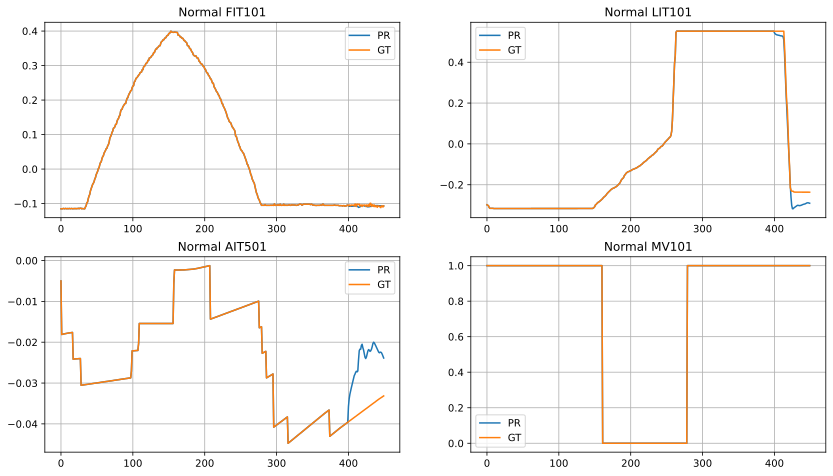

In [ ]:
fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot([*o[:, 0], *r[:, 0]], label='PR')
plt.plot([*o[:, 0], *g[:, 0]], label='GT')
plt.title('Normal FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot([*o[:, 1], *r[:, 1]], label='PR')
plt.plot([*o[:, 1], *g[:, 1]], label='GT')
plt.title('Normal LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot([*o[:, 2], *r[:, 2]], label='PR')
plt.plot([*o[:, 2], *g[:, 2]], label='GT')
plt.title('Normal AIT501')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot([*o[:, -1], *r[:, -1]], label='PR')
plt.plot([*o[:, -1], *g[:, -1]], label='GT')
plt.title('Normal MV101')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('TCN_predictions_ex.pdf', bbox_inches='tight')

In [ ]:
r = []
g = []
x, y = test_check[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :]
for i in range(len(test_check)):
  _, y = test_check[i]
  if i % 20 == 0:
    x, _ = test_check[i]
    x = torch.Tensor(x).to(device)[None, :, :]
  result = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  if result[0, -1, -1] > 0:
    result[0, -1, -1] = 1
  else:
    result[0, -1, -1] = 0
  x = torch.cat((x, result[0, -1, :][None, None, :]), dim=1)
  x = x[:, 1:, :]
  r.append(result[0, -1, :].cpu().detach().numpy())
  g.append(y[-1, :])


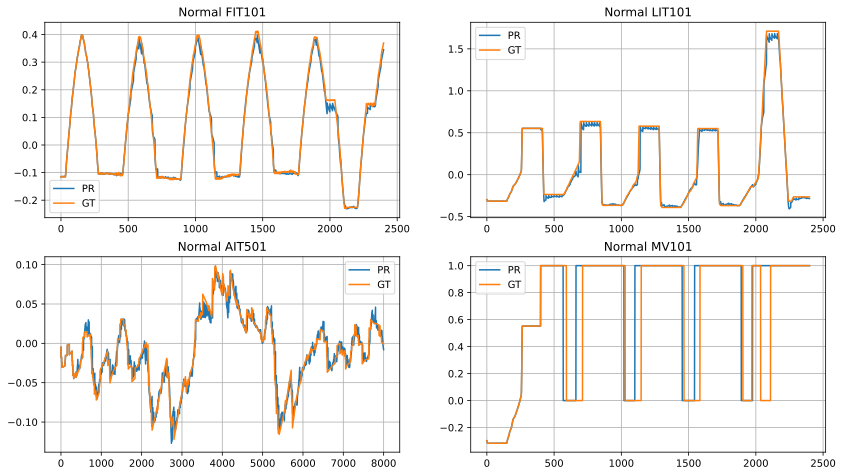

In [ ]:
g = np.array(g)
r = np.array(r)

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot([*o[:, 0], *r[:2000, 0]], label='PR')
plt.plot([*o[:, 0], *g[:2000, 0]], label='GT')
plt.title('Normal FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot([*o[:, 1], *r[:2000, 1]], label='PR')
plt.plot([*o[:, 1], *g[:2000, 1]], label='GT')
plt.title('Normal LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot([*o[:, 2], *r[:, 2]], label='PR')
plt.plot([*o[:, 2], *g[:, 2]], label='GT')
plt.title('Normal AIT501')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot([*o[:, 1], *r[:2000, -1]], label='PR')
plt.plot([*o[:, 1], *g[:2000, -1]], label='GT')
plt.title('Normal MV101')
plt.legend()
plt.grid()

plt.show()

In [38]:
class SWaT_Dataset_Autoformer(Dataset):
  def __init__(self, dataset, pred_len=12, seq_len=96, classes=51):
    self.dataset = dataset
    self.len = dataset.shape[0] -  pred_len - seq_len + 1 
    self.pred_len = pred_len
    self.seq_len = seq_len
    self.classes = classes

  def __len__(self):
    return self.len

  def __getitem__(self, idx):
    x, y = self.dataset[idx: idx + self.seq_len], self.dataset[idx + self.seq_len: idx + self.seq_len + self.pred_len]
    return x.reshape(self.seq_len, self.classes), y.reshape(self.pred_len, self.classes)

In [39]:
def train_cycle(model, epochs, criterion_bin, criterion_float, optimizer, scheduler, loaders, device, clip=2):
  losses_bin = {'train': [], 'test': []}
  losses_float = {'train': [], 'test': []}
  figure, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))
  state = None
  best_loss = 10
  for epoch in range(epochs):
    for mode, dataloader in loaders.items():
      bin_los = []
      float_los = []
      total = 0

      for x_batch, y_batch in dataloader:
        if mode == 'train':
          model.train()
          optimizer.zero_grad()
          # y_batch: (B, pred_len, C)
          # x_batch: (B, seq_len, C)
          #y_batch = y_batch[:, :, pred_idx]
          output, _ = model(x_batch.to(device, dtype=torch.float64))
          #output: (B, pred_len, classes)
          binary_output = output[:, :, -1]
          float_output = output[:, :, :3]
          loss_bin = criterion_bin(binary_output, y_batch.to(device, dtype=torch.float64)[:, :, -1])
          loss_float = criterion_float(float_output, y_batch.to(device, dtype=torch.float64)[:, :, :3])
          print(loss_float.item(), 'Train:', epoch)
          #print('tr', loss.item(), output.shape)
          #loss_bin.backward(retain_graph=True)
          total += y_batch.shape[0] * y_batch.shape[1]
          loss = loss_bin + loss_float
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
          bin_los.append(loss_bin.item())
          float_los.append(loss_float.item())
          optimizer.step()
        else:
          model.eval()
          with torch.no_grad():
            #y_batch = y_batch[:, :, pred_idx]
            output, _ = model(x_batch.to(device, dtype=torch.float64))
            total += y_batch.shape[0] * y_batch.shape[1]
            binary_output = output[:, :, -1]
            float_output = output[:, :, :3]
            loss_bin = criterion_bin(binary_output, y_batch.to(device, dtype=torch.float64)[:, :, -1])
            loss_float = criterion_float(float_output, y_batch.to(device, dtype=torch.float64)[:, :, :3])
            print(loss_float.item(), 'Test:', epoch)
  
            bin_los.append(loss_bin.item())
            float_los.append(loss_float.item())
      

      if mode == 'test' and np.sum(float_los) / (total * 3) < best_loss:
        best_loss = np.sum(float_los) / (total * 3)
        state = model.state_dict()
        print('BEST EPOCH: ', epoch)

      losses_bin[mode].append(np.sum(bin_los) / total)
      losses_float[mode].append(np.sum(float_los) / (total * 3))

    ax1.set_xlim(0, epoch)
    ax1.cla()
    ax2.set_xlim(0, epoch)
    ax2.cla()
    clear_output(wait=True)
    ax1.plot(range(epoch + 1), losses_bin['train'], label='train', linestyle='dashed')
    ax1.plot(range(epoch + 1), losses_bin['test'], label='test', linestyle='solid')
    ax2.plot(range(epoch + 1), losses_float['train'], label='train', linestyle='dashed')
    ax2.plot(range(epoch + 1), losses_float['test'], label='test', linestyle='solid')
    ax1.set_xlabel('Epochs')
    ax2.set_xlabel('Epochs')
    ax1.set_ylabel('Loss_bin')
    ax2.set_ylabel('Loss_float')
    ax1.grid(True)
    ax2.grid(True)
    ax1.legend()
    ax2.legend()
    display(figure)
    if scheduler is not None:
      scheduler.step()
  return np.array(losses_bin['test']), np.array(losses_bin['train']), np.array(losses_float['test']), np.array(losses_float['train']), state

In [40]:
train_data.shape, test_data.shape

((31500, 51), (8000, 51))

In [41]:
train_dataset = SWaT_Dataset_Autoformer(train_data[:, prediction_idx], 10, 400, 4)
test_dataset = SWaT_Dataset_Autoformer(test_data[:, prediction_idx], 10, 400, 4)

#batch_size = 64
#train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
#test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

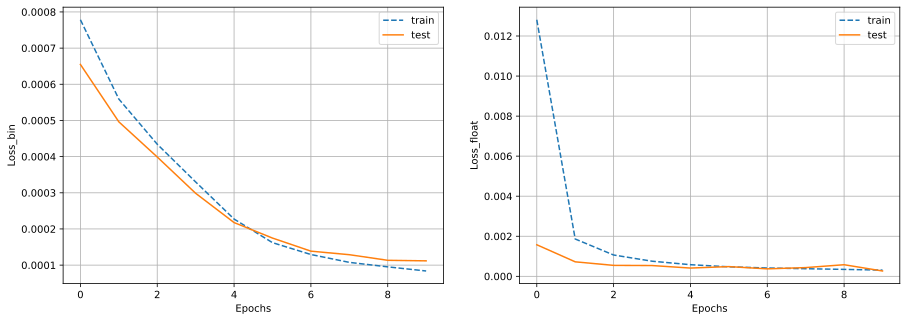

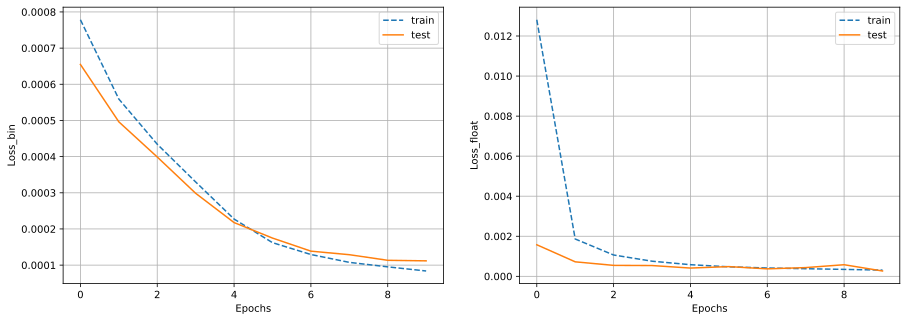

In [42]:
from AutoFormer import AutoFormerSWaT, AutoFormer

device = "cuda" if torch.cuda.is_available() else "cpu"
model = AutoFormerSWaT(seq_len=400, label_len=400, pred_len=10, input_dim=4, d_model=256, classes=4)
model.to(device)

batch_size = 64
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

lr = 1e-4
epochs = 10

criterion_bin = torch.nn.BCEWithLogitsLoss()
criterion_float = torch.nn.MSELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

loaders = {'train': train_dataloader, 'test': test_dataloader}
losses_bin_test, losses_bin_train, losses_float_test, losses_float_train, AF_state = train_cycle(model, epochs, criterion_bin, criterion_float, optimizer, None, loaders, device)

In [43]:
torch.save(AF_state, 'AutoFormer_SWaT')
model.load_state_dict(torch.load('/content/AutoFormer_SWaT'))

<All keys matched successfully>

In [44]:
all = 0
for i in model.named_parameters():
  print(i[1].max())
  all += i[1].reshape(-1).shape[0]

print(all)

tensor(1.3131, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.2869, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(3.8823, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(3.4750, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(3.3681, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(3.4844, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(3.6097, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0824, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0001, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0898, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0614, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0870, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(8.5109e-05, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0725, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0500, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0761, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0597, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0489, device='cuda:0', grad_fn=<Max

In [45]:
losses_float_test

array([0.0015749 , 0.0007231 , 0.00054591, 0.00053801, 0.00041182,
       0.00048495, 0.00037219, 0.00043494, 0.0005785 , 0.0002654 ])

In [46]:
r = []
g = []
x, y = test_dataset[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
model.eval()
for i in range(1):
  _, y = test_dataset[i*10]
  result, _ = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  r.append(result.cpu().detach().numpy())
  g.append(y)

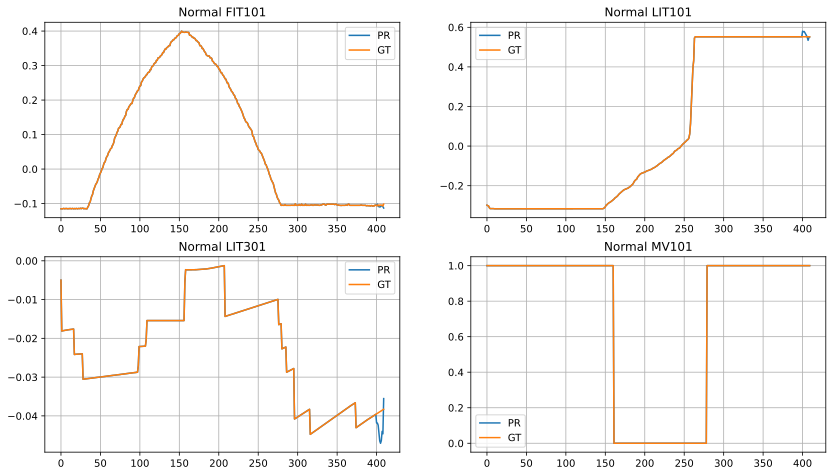

In [47]:
r = np.array(r)
g = np.array(g)

r = r.reshape(-1, 4)
g = g.reshape(-1, 4)

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot([*o[:, 0], *r[:, 0]], label='PR')
plt.plot([*o[:, 0], *g[:, 0]], label='GT')
plt.title('Normal FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot([*o[:, 1], *r[:, 1]], label='PR')
plt.plot([*o[:, 1], *g[:, 1]], label='GT')
plt.title('Normal LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot([*o[:, 2], *r[:, 2]], label='PR')
plt.plot([*o[:, 2], *g[:, 2]], label='GT')
plt.title('Normal LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot([*o[:, -1], *r[:, -1]], label='PR')
plt.plot([*o[:, -1], *g[:, -1]], label='GT')
plt.title('Normal MV101')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('AutoFormer_predictions_ex.pdf', bbox_inches='tight')

In [48]:
r = []
g = []
x, y = test_dataset[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
for i in range(len(test_dataset) // 10):
  if i % 2 == 0:
    x, _ = test_dataset[i*10]
    x = torch.Tensor(x).to(device)[None, :, :].double()
  _, y = test_dataset[i*10]
  result, _ = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  r.append(result.cpu().detach().numpy())
  g.append(y)

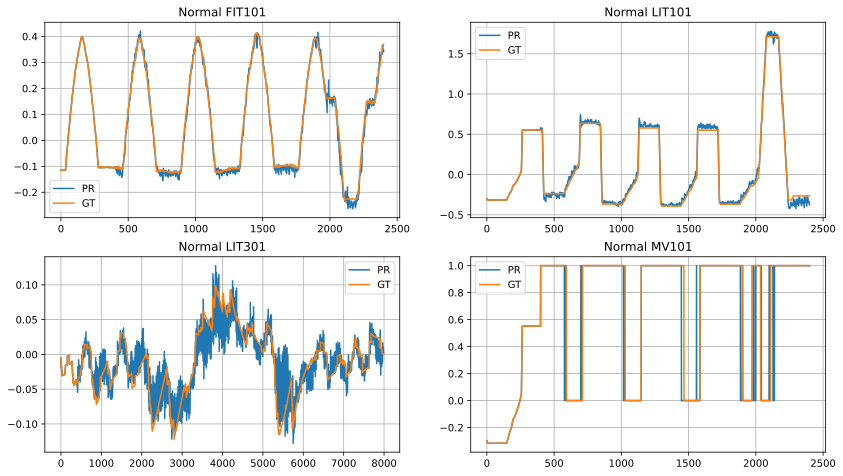

In [49]:
r = np.array(r)
g = np.array(g)

r = r.reshape(-1, 4)
g = g.reshape(-1, 4)

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot([*o[:, 0], *r[:2000, 0]], label='PR')
plt.plot([*o[:, 0], *g[:2000, 0]], label='GT')
plt.title('Normal FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot([*o[:, 1], *r[:2000, 1]], label='PR')
plt.plot([*o[:, 1], *g[:2000, 1]], label='GT')
plt.title('Normal LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot([*o[:, 2], *r[:, 2]], label='PR')
plt.plot([*o[:, 2], *g[:, 2]], label='GT')
plt.title('Normal LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot([*o[:, 1], *r[:2000, -1]], label='PR')
plt.plot([*o[:, 1], *g[:2000, -1]], label='GT')
plt.title('Normal MV101')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('AutoFormer_predictions_ex_step_20.pdf', bbox_inches='tight')

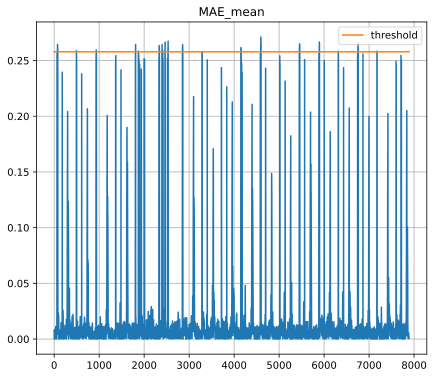

In [ ]:
mae_mean = np.abs((g - r).mean(axis=1))

fig = plt.figure(figsize=(7, 6))
plt.plot(mae_mean)
mean_threshold = np.quantile(mae_mean, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold), label='threshold')
plt.grid()
plt.legend()
plt.title('MAE_mean');

In [ ]:
fig.savefig('MAE_mean.pdf', bbox_inches='tight')

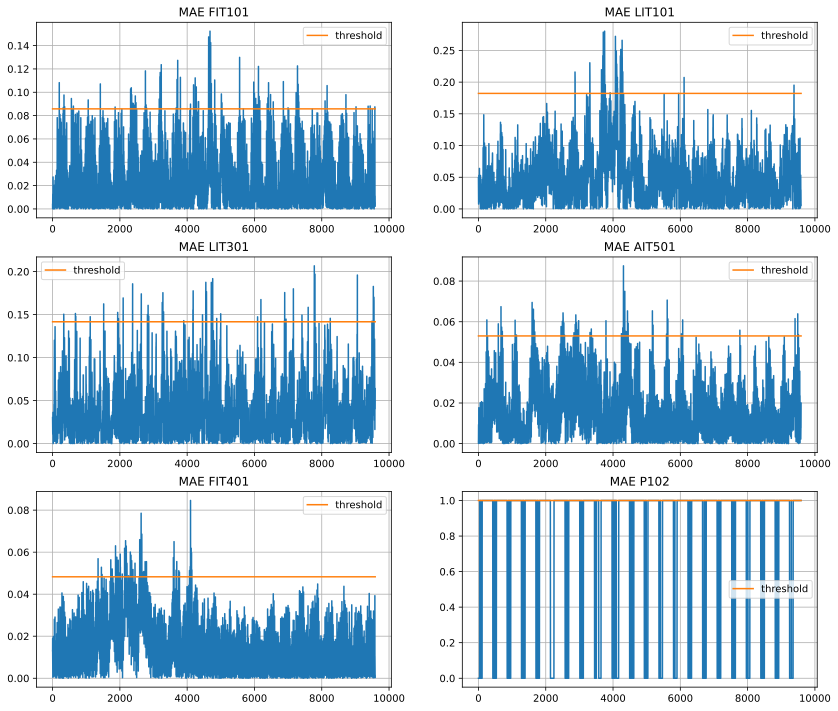

In [ ]:

mae= np.abs((g - r))

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
mae_fit101 = mae[:, 0]
plt.plot(mae_fit101)
mean_threshold_fit101 = np.quantile(mae_fit101, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit101), label='threshold')
plt.title('MAE FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
mae_lit101 = mae[:, 1]
plt.plot(mae_lit101)
mean_threshold_lit101 = np.quantile(mae_lit101, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit101), label='threshold')
plt.title('MAE LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
mae_lit301 = mae[:, 2]
plt.plot(mae_lit301)
mean_threshold_lit301 = np.quantile(mae_lit301, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit301), label='threshold')
plt.title('MAE LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
mae_ait501 = mae[:, 3]
plt.plot(mae_ait501)
mean_threshold_ait501 = np.quantile(mae_ait501, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_ait501), label='threshold')
plt.title('MAE AIT501')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 5)
mae_fit401 = mae[:, 4]
plt.plot(mae_fit401)
mean_threshold_fit401 = np.quantile(mae_fit401, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit401), label='threshold')
plt.title('MAE FIT401')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 6)
mae_p102 = mae[:, 5]
plt.plot(mae_p102)
mean_threshold_p102 = np.quantile(mae_p102, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_p102), label='threshold')
plt.title('MAE P102')
plt.legend()
plt.grid()

plt.show()


In [ ]:
fig.savefig('MAE_channels.pdf', bbox_inches='tight')

In [ ]:
val_check = SWaT_Dataset_Autoformer(normal_data[:36500, prediction_idx], 10, 400, 6)
control_check = SWaT_Dataset_Autoformer(test_data[5000:, prediction_idx], 10, 400, 6)

r = []
g = []
x, y = val_check[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
for i in range(len(val_check) // 10):
  if i % 2 == 0:
    x, _ = val_check[i*10]
    x = torch.Tensor(x).to(device)[None, :, :].double()
  _, y = val_check[i*10]
  result, _ = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  #print(result.shape, y.shape)
  r.append(result.cpu().detach().numpy())
  g.append(y)

In [ ]:
r = np.array(r)
g = np.array(g)

r = r.reshape(-1, 6)
g = g.reshape(-1, 6)

In [ ]:
g.shape

(36090, 6)

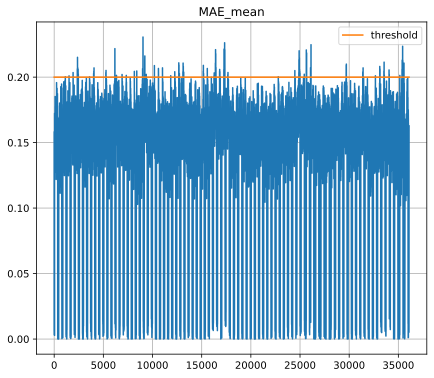

In [ ]:
mae_mean = np.abs((g - r).mean(axis=1))

fig = plt.figure(figsize=(7, 6))
plt.plot(mae_mean)
mean_threshold = np.quantile(mae_mean, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold), label='threshold')
plt.grid()
plt.legend()
plt.title('MAE_mean');

In [ ]:
fig.savefig('MAE_mean_val_plus_train.pdf', bbox_inches='tight')

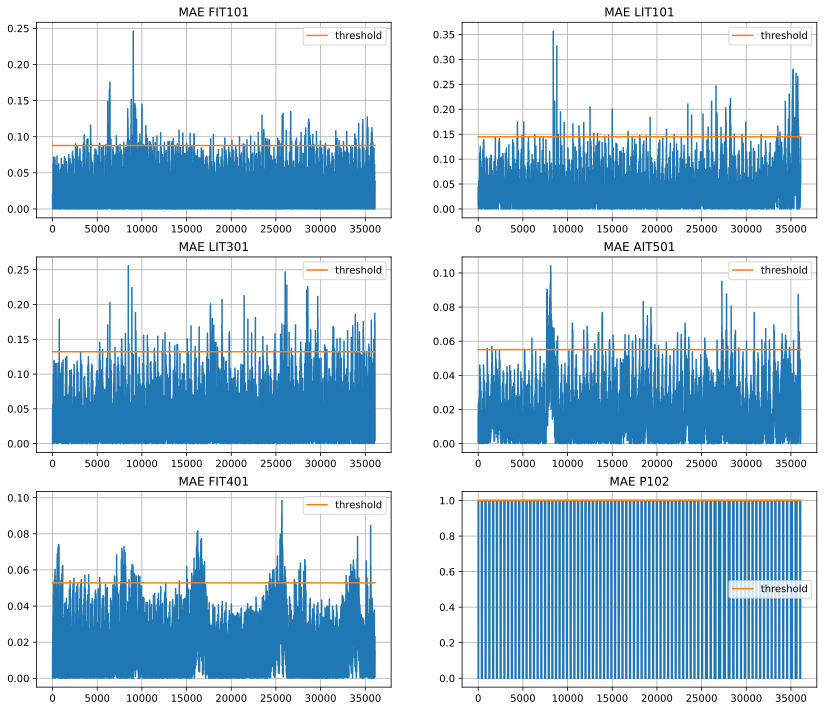

In [ ]:

mae= np.abs((g - r))

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
mae_fit101 = mae[:, 0]
plt.plot(mae_fit101)
mean_threshold_fit101 = np.quantile(mae_fit101, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit101), label='threshold')
plt.title('MAE FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
mae_lit101 = mae[:, 1]
plt.plot(mae_lit101)
mean_threshold_lit101 = np.quantile(mae_lit101, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit101), label='threshold')
plt.title('MAE LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
mae_lit301 = mae[:, 2]
plt.plot(mae_lit301)
mean_threshold_lit301 = np.quantile(mae_lit301, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit301), label='threshold')
plt.title('MAE LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
mae_ait501 = mae[:, 3]
plt.plot(mae_ait501)
mean_threshold_ait501 = np.quantile(mae_ait501, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_ait501), label='threshold')
plt.title('MAE AIT501')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 5)
mae_fit401 = mae[:, 4]
plt.plot(mae_fit401)
mean_threshold_fit401 = np.quantile(mae_fit401, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit401), label='threshold')
plt.title('MAE FIT401')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 6)
mae_p102 = mae[:, 5]
plt.plot(mae_p102)
mean_threshold_p102 = np.quantile(mae_p102, 0.99)
plt.plot(np.full(mae_mean.shape, mean_threshold_p102), label='threshold')
plt.title('MAE P102')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('MAE_channels_val_plus_train.pdf', bbox_inches='tight')

In [ ]:

r = []
g = []
x, y = control_check[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
for i in range(len(control_check) // 10):
  if i % 2 == 0:
    x, _ = control_check[i*10]
    x = torch.Tensor(x).to(device)[None, :, :].double()
  _, y = control_check[i*10]
  result, _ = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  #print(result.shape, y.shape)
  r.append(result.cpu().detach().numpy())
  g.append(y)

In [ ]:
r = np.array(r)
g = np.array(g)

r = r.reshape(-1, 6)
g = g.reshape(-1, 6)

In [ ]:
alpha = 1 - np.exp(np.log(0.5) / 100)

mae = np.abs((g - r))
mae_mean = mae.mean(axis=1)
mae_fit101 = mae[:, 0]
mae_lit101 = mae[:, 1]
mae_lit301 = mae[:, 2]
mae_ait501 = mae[:, 3]
mae_fit401 = mae[:, 4]
mae_p101 = mae[:, 5]

exp_mae_mean = []
exp_mae_fit101 = []
exp_mae_lit101 = []
exp_mae_lit301 = []
exp_mae_ait501 = []
exp_mae_fit401 = []
exp_mae_p101 = []
last_1 = 0
last_2 = 0
last_3 = 0
last_4 = 0
last_5 = 0
last_6 = 0
last_7 = 0
for i in mae_fit101:
  last_1 = alpha * i + (1 - alpha) * last_1
  exp_mae_fit101.append(last_1)
for i in mae_lit101:
  last_2 = alpha * i + (1 - alpha) * last_2
  exp_mae_lit101.append(last_2)
for i in mae_lit301:
  last_3 = alpha * i + (1 - alpha) * last_3
  exp_mae_lit301.append(last_3)
for i in mae_ait501:
  last_4 = alpha * i + (1 - alpha) * last_4
  exp_mae_ait501.append(last_4)
for i in mae_fit401:
  last_5 = alpha * i + (1 - alpha) * last_5
  exp_mae_fit401.append(last_5)
for i in mae_p101:
  last_6 = alpha * i + (1 - alpha) * last_6
  exp_mae_p101.append(last_6)
for i in mae_mean:
  last_7 = alpha * i + (1 - alpha) * last_7
  exp_mae_mean.append(last_7)

exp_mae_fit101 = np.array(exp_mae_fit101)
exp_mae_lit101 = np.array(exp_mae_lit101)
exp_mae_lit301 = np.array(exp_mae_lit301)
exp_mae_ait501 = np.array(exp_mae_ait501)
exp_mae_fit401 = np.array(exp_mae_fit401)
exp_mae_p101 = np.array(exp_mae_p101)
exp_mae_mean = np.array(exp_mae_mean)

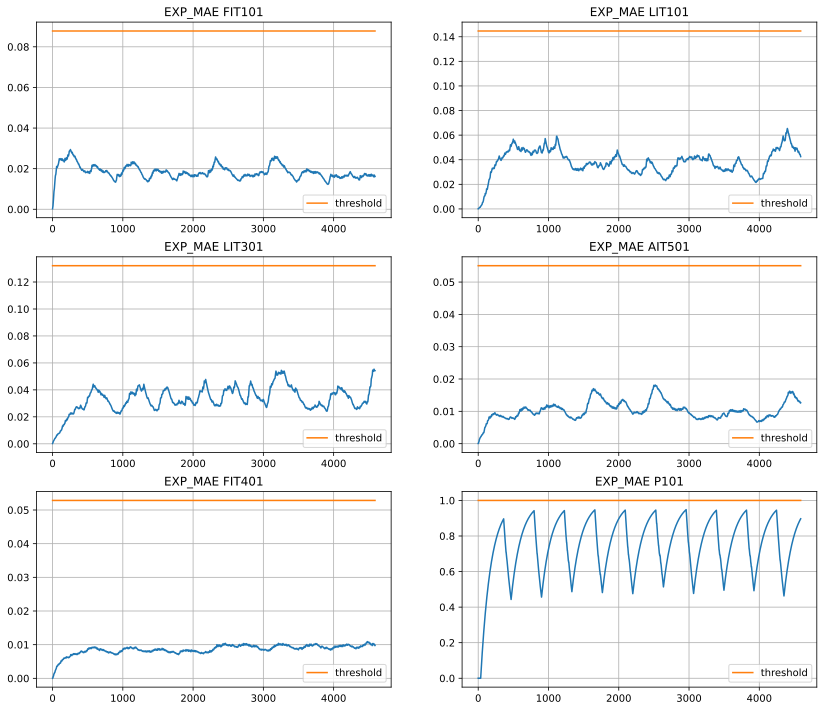

In [ ]:
fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot(exp_mae_fit101)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit101), label='threshold')
plt.title('EXP_MAE FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot(exp_mae_lit101)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit101), label='threshold')
plt.title('EXP_MAE LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot(exp_mae_lit301)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit301), label='threshold')
plt.title('EXP_MAE LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot(exp_mae_ait501)
plt.plot(np.full(mae_mean.shape, mean_threshold_ait501), label='threshold')
plt.title('EXP_MAE AIT501')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 5)
plt.plot(exp_mae_fit401)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit401), label='threshold')
plt.title('EXP_MAE FIT401')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 6)
plt.plot(exp_mae_p101)
plt.plot(np.full(mae_mean.shape, mean_threshold_p102), label='threshold')
plt.title('EXP_MAE P101')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('EXP_MAE_channels_control.pdf', bbox_inches='tight')

In [ ]:
anomaly_check = SWaT_Dataset_Autoformer(anomaly_data[:, prediction_idx], 10, 400, 6)


r_anomaly = []
g_anomaly = []
x, y = anomaly_check[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
for i in range(len(anomaly_check) // 10):
  if i % 2 == 0:
    x, _ = anomaly_check[i*10]
    x = torch.Tensor(x).to(device)[None, :, :].double()
  _, y = anomaly_check[i*10]
  result, _ = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  #print(result.shape, y.shape)
  r_anomaly.append(result.cpu().detach().numpy())
  g_anomaly.append(y)

In [ ]:
g_anomaly = np.array(g_anomaly)
r_anomaly = np.array(r_anomaly)

r_anomaly = r_anomaly.reshape(-1, 6)
g_anomaly = g_anomaly.reshape(-1, 6)

mae = np.abs((g_anomaly - r_anomaly))
mae_mean = mae.mean(axis=1)
mae_fit101 = mae[:, 0]
mae_lit101 = mae[:, 1]
mae_lit301 = mae[:, 2]
mae_ait501 = mae[:, 3]
mae_fit401 = mae[:, 4]
mae_p101 = mae[:, 5]

exp_mae_mean = []
exp_mae_fit101 = []
exp_mae_lit101 = []
exp_mae_lit301 = []
exp_mae_ait501 = []
exp_mae_fit401 = []
exp_mae_p101 = []
last_1 = 0
last_2 = 0
last_3 = 0
last_4 = 0
last_5 = 0
last_6 = 0
last_7 = 0
for i in mae_fit101:
  last_1 = alpha * i + (1 - alpha) * last_1
  exp_mae_fit101.append(last_1)
for i in mae_lit101:
  last_2 = alpha * i + (1 - alpha) * last_2
  exp_mae_lit101.append(last_2)
for i in mae_lit301:
  last_3 = alpha * i + (1 - alpha) * last_3
  exp_mae_lit301.append(last_3)
for i in mae_ait501:
  last_4 = alpha * i + (1 - alpha) * last_4
  exp_mae_ait501.append(last_4)
for i in mae_fit401:
  last_5 = alpha * i + (1 - alpha) * last_5
  exp_mae_fit401.append(last_5)
for i in mae_p101:
  last_6 = alpha * i + (1 - alpha) * last_6
  exp_mae_p101.append(last_6)
for i in mae_mean:
  last_7 = alpha * i + (1 - alpha) * last_7
  exp_mae_mean.append(last_7)

exp_mae_fit101 = np.array(exp_mae_fit101)
exp_mae_lit101 = np.array(exp_mae_lit101)
exp_mae_lit301 = np.array(exp_mae_lit301)
exp_mae_ait501 = np.array(exp_mae_ait501)
exp_mae_fit401 = np.array(exp_mae_fit401)
exp_mae_p101 = np.array(exp_mae_p101)
exp_mae_mean = np.array(exp_mae_mean)

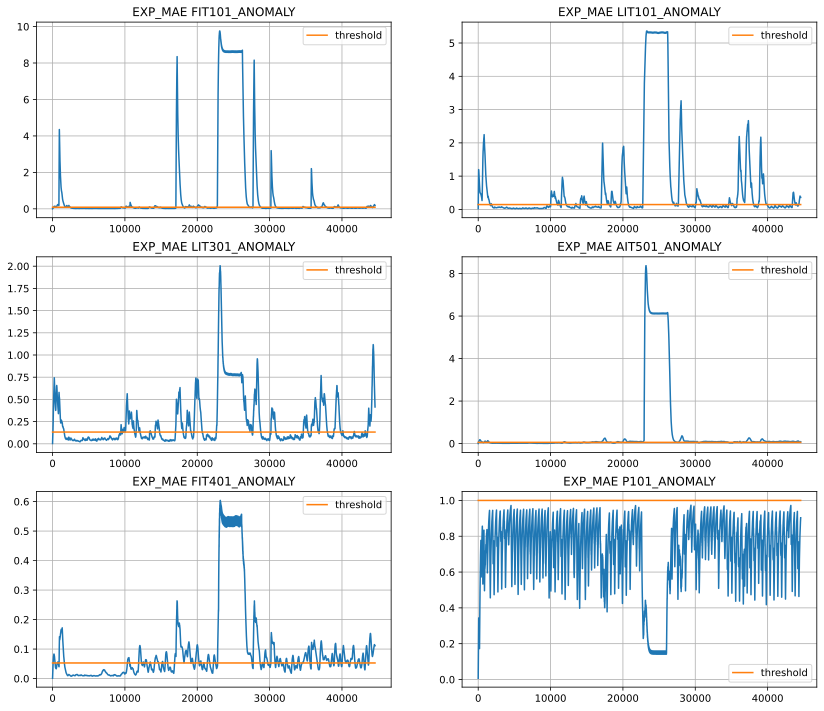

In [ ]:
fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot(exp_mae_fit101)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit101), label='threshold')
plt.title('EXP_MAE FIT101_ANOMALY')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot(exp_mae_lit101)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit101), label='threshold')
plt.title('EXP_MAE LIT101_ANOMALY')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot(exp_mae_lit301)
plt.plot(np.full(mae_mean.shape, mean_threshold_lit301), label='threshold')
plt.title('EXP_MAE LIT301_ANOMALY')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot(exp_mae_ait501)
plt.plot(np.full(mae_mean.shape, mean_threshold_ait501), label='threshold')
plt.title('EXP_MAE AIT501_ANOMALY')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 5)
plt.plot(exp_mae_fit401)
plt.plot(np.full(mae_mean.shape, mean_threshold_fit401), label='threshold')
plt.title('EXP_MAE FIT401_ANOMALY')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 6)
plt.plot(exp_mae_p101)
plt.plot(np.full(mae_mean.shape, mean_threshold_p102), label='threshold')
plt.title('EXP_MAE P101_ANOMALY')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('EXP_MAE_channels_anomaly.pdf', bbox_inches='tight')

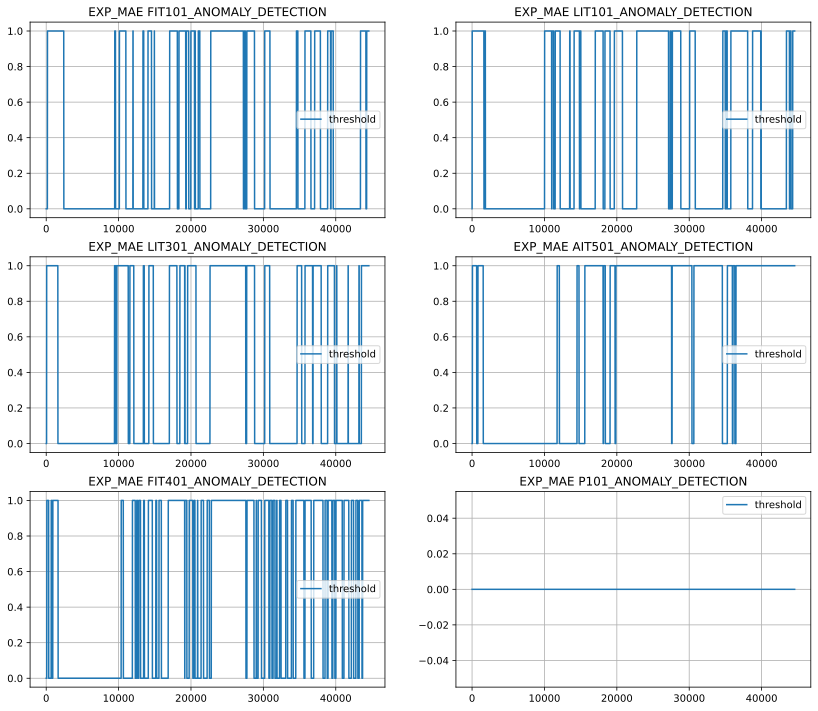

In [ ]:
fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot(exp_mae_fit101 > mean_threshold_fit101, label='threshold')
plt.title('EXP_MAE FIT101_ANOMALY_DETECTION')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot(exp_mae_lit101 > mean_threshold_lit101, label='threshold')
plt.title('EXP_MAE LIT101_ANOMALY_DETECTION')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot(exp_mae_lit301 > mean_threshold_lit301, label='threshold')
plt.title('EXP_MAE LIT301_ANOMALY_DETECTION')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot(exp_mae_ait501 > mean_threshold_ait501, label='threshold')
plt.title('EXP_MAE AIT501_ANOMALY_DETECTION')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 5)
plt.plot(exp_mae_fit401 > mean_threshold_fit401, label='threshold')
plt.title('EXP_MAE FIT401_ANOMALY_DETECTION')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 6)
plt.plot(exp_mae_p101 > mean_threshold_p102, label='threshold')
plt.title('EXP_MAE P101_ANOMALY_DETECTION')
plt.legend()
plt.grid()

plt.show()

In [ ]:
fig.savefig('EXP_MAE_channels_anomaly_detection.pdf', bbox_inches='tight')

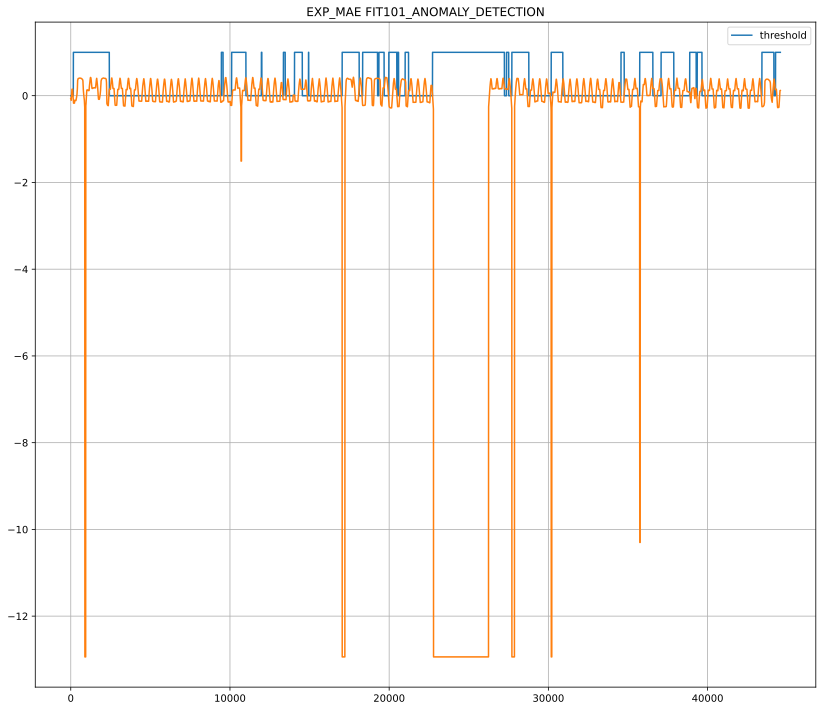

In [ ]:
fig = plt.figure(figsize=(14, 12))
plt.plot(exp_mae_fit101 > mean_threshold_fit101, label='threshold')
plt.plot(g_anomaly[:, 0])
plt.title('EXP_MAE FIT101_ANOMALY_DETECTION')
plt.legend()
plt.grid()

In [ ]:
filling = state * 2
filling[filling == 0] = -13
filling = filling[400:]

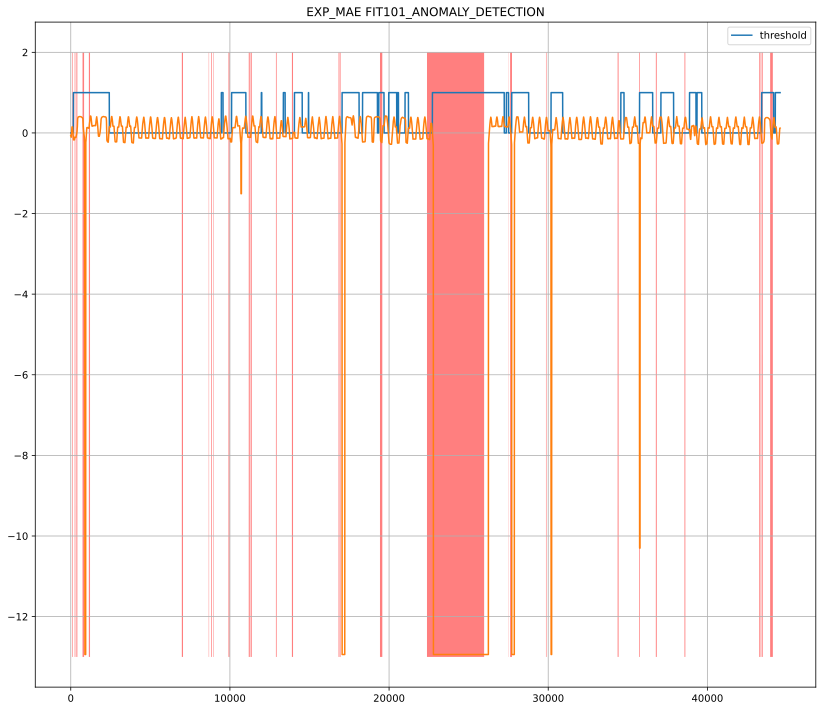

In [ ]:
fig = plt.figure(figsize=(14, 12))
plt.plot(exp_mae_fit101 > mean_threshold_fit101, label='threshold')
plt.plot(g_anomaly[:, 0])
plt.fill(np.arange(filling.shape[0]), filling, 'r', alpha=0.5)
plt.title('EXP_MAE FIT101_ANOMALY_DETECTION')
plt.legend()
plt.grid()

In [ ]:
fig.savefig('EXP_MAE FIT101_ANOMALY_DETECTION_COMPARISON.pdf', bbox_inches='tight')

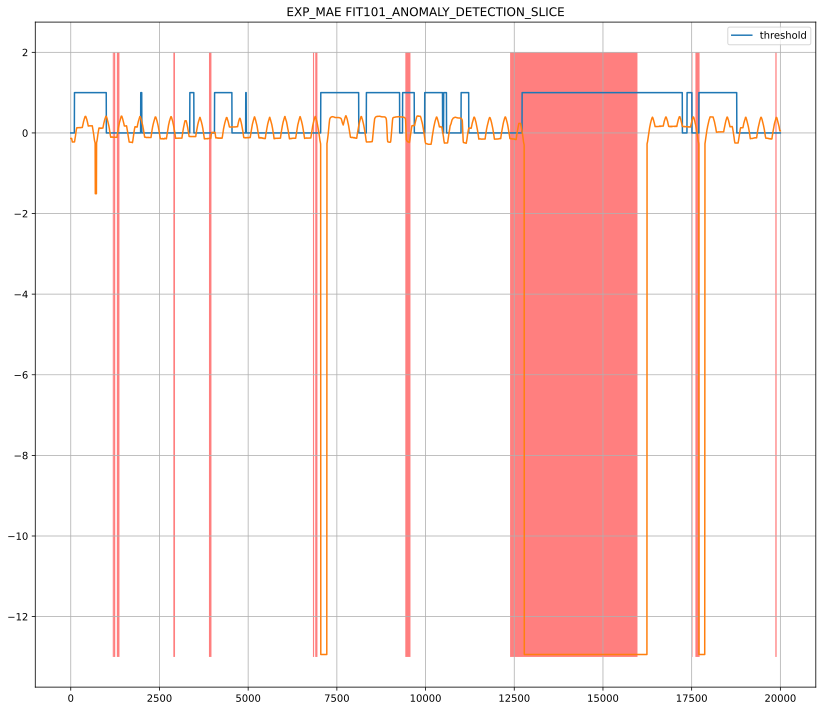

In [ ]:
fig = plt.figure(figsize=(14, 12))
plt.plot((exp_mae_fit101 > mean_threshold_fit101)[10000: 30000], label='threshold')
plt.plot(g_anomaly[10000: 30000, 0])
plt.fill(np.arange(20000), filling[10000: 30000], 'r', alpha=0.5)
plt.title('EXP_MAE FIT101_ANOMALY_DETECTION_SLICE')
plt.legend()
plt.grid()

In [ ]:
fig.savefig('EXP_MAE FIT101_ANOMALY_DETECTION_COMPARISON_SLICE.pdf', bbox_inches='tight')

In [ ]:
from sklearn.metrics import recall_score, precision_score, f1_score

y_pred = exp_mae_fit101 > mean_threshold_fit101
y_true = state[:y_pred.shape[0]]

fit101_f1 = f1_score(y_true, y_pred)
fit101_precision = precision_score(y_true, y_pred)
fit101_recall = recall_score(y_true, y_pred)

In [ ]:
print('FIT101_F1_SCORE: ', fit101_f1)
print('FIT101_PRECISION_SCORE: ', fit101_precision)
print('FIT101_RECALL_SCORE: ', fit101_recall)

FIT101_F1_SCORE:  0.4349481888229563
FIT101_PRECISION_SCORE:  0.28695804604417435
FIT101_RECALL_SCORE:  0.898134601316752


In [ ]:
def train_cycle_EncDec(model, epochs, criterion_bin, criterion_float, optimizer, scheduler, loaders, device, clip=2):
  losses_bin = {'train': [], 'test': []}
  losses_float = {'train': [], 'test': []}
  figure, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))
  state = None
  best_loss = 10
  for epoch in range(epochs):
    for mode, dataloader in loaders.items():
      bin_los = []
      float_los = []
      total = 0

      for x_batch, y_batch in dataloader:
        if mode == 'train':
          model.train()
          optimizer.zero_grad()
          # y_batch: (B, pred_len, 4)
          # x_batch: (B, seq_len, 4)
          
          x = x_batch[:, :400, :]
          target = x_batch[:, 400:, :]
          y_batch = y_batch[:, -20:, :]
          #print(x.shape, target.shape)

          output, _ = model(x.to(device).float(), target.to(device).float())
          #output: (B, pred_len, classes)
          binary_output = output[:, :, -1]
          float_output = output[:, :, : 3]
          loss_bin = criterion_bin(binary_output, y_batch.to(device)[:, :, -1])
          loss_float = criterion_float(float_output, y_batch.to(device)[:, :, :3].float())
          print(loss_float.item(), 'Train:', epoch)
          #print('tr', loss.item(), output.shape)
          #loss_bin.backward(retain_graph=True)
          total += y_batch.shape[0] * y_batch.shape[1]
          loss = loss_bin + loss_float
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
          bin_los.append(loss_bin.item())
          float_los.append(loss_float.item())
          optimizer.step()
        else:
          model.eval()
          with torch.no_grad():
            #y_batch = y_batch[:, :, 4]
            x = x_batch[:, :400, :]
            target = x_batch[:, 400:, :]
            y_batch = y_batch[:, -20:, :]

            output, _ = model(x.to(device).float(), target.to(device).float())
            #output: (B, pred_len, 4)
            binary_output = output[:, :, -1]
            float_output = output[:, :, : 3]
            loss_bin = criterion_bin(binary_output, y_batch.to(device)[:, :, -1])
            loss_float = criterion_float(float_output, y_batch.to(device)[:, :, :3].float())
            total += y_batch.shape[0] * y_batch.shape[1]

            print(loss_float.item(), 'Test:', epoch)

            bin_los.append(loss_bin.item())
            float_los.append(loss_float.item())

      if mode == 'test' and np.sum(float_los) / (total * 3) < best_loss:
        best_loss = np.sum(float_los) / (total * 3)
        state = model.state_dict()
        print('BEST EPOCH: ', epoch)
      losses_bin[mode].append(np.sum(bin_los) / total)
      losses_float[mode].append(np.sum(float_los) / (total * 3))

    ax1.set_xlim(0, epoch)
    ax1.cla()
    ax2.set_xlim(0, epoch)
    ax2.cla()
    clear_output(wait=True)
    ax1.plot(range(epoch + 1), losses_bin['train'], label='train', linestyle='dashed')
    ax1.plot(range(epoch + 1), losses_bin['test'], label='test', linestyle='solid')
    ax2.plot(range(epoch + 1), losses_float['train'], label='train', linestyle='dashed')
    ax2.plot(range(epoch + 1), losses_float['test'], label='test', linestyle='solid')
    ax1.set_xlabel('Epochs')
    ax2.set_xlabel('Epochs')
    ax1.set_ylabel('Loss_bin')
    ax2.set_ylabel('Loss_float')
    ax1.grid(True)
    ax2.grid(True)
    ax1.legend()
    ax2.legend()
    display(figure)
    if scheduler is not None:
      scheduler.step()
  return np.array(losses_bin['test']), np.array(losses_bin['train']), np.array(losses_float['test']), np.array(losses_float['train']), state

In [ ]:
train_check = SWaT_Dataset_Autoformer_TCN(train_data[:, prediction_idx], 420, 4)
test_check = SWaT_Dataset_Autoformer_TCN(test_data[:, prediction_idx], 420, 4)

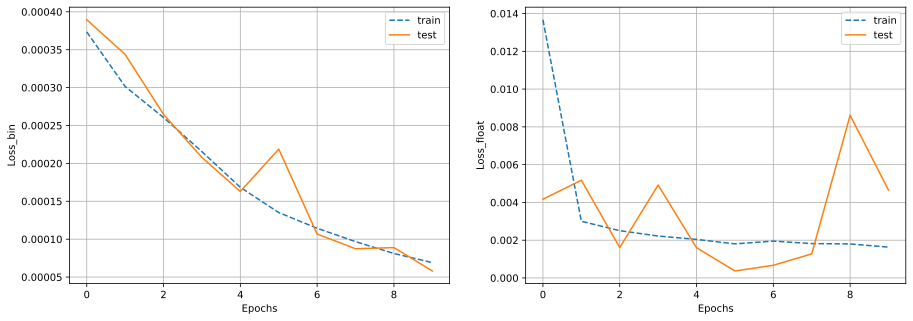

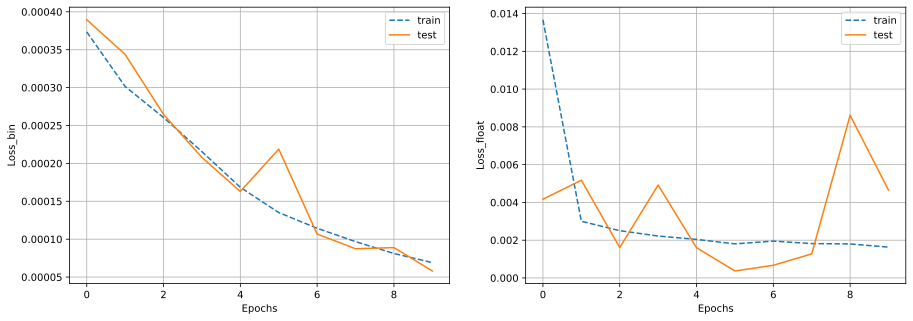

In [ ]:
from TCN import TCN_EncDecAttn

dropout = 0.1
kernel_size = 7
n = 8
hidden_channels = 128
r_seed = 42

input_channels = 4
n_classes = 4
channel_sizes = [hidden_channels] * n

device = "cuda" if torch.cuda.is_available() else "cpu"
model = TCN_EncDecAttn(n_classes, input_channels, channel_sizes, kernel_size=kernel_size, dropout=dropout, num_heads=32, device=device).to(device)

lr = 1e-4
epochs = 10

batch_size = 64
train_dataloader = DataLoader(train_check, shuffle=True, batch_size=batch_size)
test_dataloader = DataLoader(test_check, shuffle=False, batch_size=batch_size)

criterion_bin = torch.nn.BCEWithLogitsLoss()
criterion_float = torch.nn.MSELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

loaders = {'train': train_dataloader, 'test': test_dataloader}
losses_bin_test, losses_bin_train, losses_float_test, losses_float_train, EncDec_state = train_cycle_EncDec(model, epochs, criterion_bin, criterion_float, optimizer, None, loaders, device)

In [ ]:
torch.save(EncDec_state, 'EncDec_SWaT')

In [ ]:
model.load_state_dict(torch.load('/content/EncDec_SWaT'))

<All keys matched successfully>

In [ ]:
all = 0
for i in model.named_parameters():
  all += i[1].reshape(-1).shape[0]
  print(i[1].max())

print('Num of params: ', all)


tensor(0.1951, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6830, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.2184, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0398, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6095, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0828, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0580, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.4899, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0338, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6250, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0597, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0369, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.5996, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0570, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0354, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.6088, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0604, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0348, device='cuda:0', grad_fn=<MaxBack

In [ ]:
losses_float_test

array([0.00416932, 0.00517522, 0.00161047, 0.00491902, 0.00160013,
       0.00036796, 0.00067204, 0.00127522, 0.00861257, 0.00464746])

In [ ]:
from TimesNet import Model

In [ ]:
def train_cycle(model, epochs, criterion_bin, criterion_float, optimizer, scheduler, loaders, device, clip=2):
  losses_bin = {'train': [], 'test': []}
  losses_float = {'train': [], 'test': []}
  figure, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))
  state = None
  best_loss = 10
  for epoch in range(epochs):
    for mode, dataloader in loaders.items():
      bin_los = []
      float_los = []
      total = 0

      for x_batch, y_batch in dataloader:
        if mode == 'train':
          model.train()
          optimizer.zero_grad()
          # y_batch: (B, pred_len, C)
          # x_batch: (B, seq_len, C)
          #y_batch = y_batch[:, :, pred_idx]
          output = model(x_batch.to(device, dtype=torch.float64))
          #output: (B, pred_len, classes)
          binary_output = output[:, :, -1].double()
          float_output = output[:, :, :3].double()
          loss_bin = criterion_bin(binary_output, y_batch.to(device, dtype=torch.float64)[:, :, -1])
          loss_float = criterion_float(float_output, y_batch.to(device, dtype=torch.float64)[:, :, :3])
          print(loss_float.item(), 'Train:', epoch)
          #print('tr', loss.item(), output.shape)
          #loss_bin.backward(retain_graph=True)
          total += y_batch.shape[0] * y_batch.shape[1]
          loss = loss_bin + loss_float
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
          bin_los.append(loss_bin.item())
          float_los.append(loss_float.item())
          optimizer.step()
        else:
          model.eval()
          with torch.no_grad():
            #y_batch = y_batch[:, :, pred_idx]
            output = model(x_batch.to(device, dtype=torch.float64))
            total += y_batch.shape[0] * y_batch.shape[1]
            binary_output = output[:, :, -1]
            float_output = output[:, :, :3]
            loss_bin = criterion_bin(binary_output, y_batch.to(device, dtype=torch.float64)[:, :, -1])
            loss_float = criterion_float(float_output, y_batch.to(device, dtype=torch.float64)[:, :, :3])
            print(loss_float.item(), 'Test:', epoch)
  
            bin_los.append(loss_bin.item())
            float_los.append(loss_float.item())
      

      if mode == 'test' and np.sum(float_los) / (total * 3) < best_loss:
        best_loss = np.sum(float_los) / (total * 3)
        state = model.state_dict()
        print('BEST EPOCH: ', epoch)

      losses_bin[mode].append(np.sum(bin_los) / total)
      losses_float[mode].append(np.sum(float_los) / (total * 3))

    ax1.set_xlim(0, epoch)
    ax1.cla()
    ax2.set_xlim(0, epoch)
    ax2.cla()
    clear_output(wait=True)
    ax1.plot(range(epoch + 1), losses_bin['train'], label='train', linestyle='dashed')
    ax1.plot(range(epoch + 1), losses_bin['test'], label='test', linestyle='solid')
    ax2.plot(range(epoch + 1), losses_float['train'], label='train', linestyle='dashed')
    ax2.plot(range(epoch + 1), losses_float['test'], label='test', linestyle='solid')
    ax1.set_xlabel('Epochs')
    ax2.set_xlabel('Epochs')
    ax1.set_ylabel('Loss_bin')
    ax2.set_ylabel('Loss_float')
    ax1.grid(True)
    ax2.grid(True)
    ax1.legend()
    ax2.legend()
    display(figure)
    if scheduler is not None:
      scheduler.step()
  return np.array(losses_bin['test']), np.array(losses_bin['train']), np.array(losses_float['test']), np.array(losses_float['train']), state

In [ ]:
train_dataset = SWaT_Dataset_Autoformer(train_data[:, prediction_idx], 10, 400, 4)
test_dataset = SWaT_Dataset_Autoformer(test_data[:, prediction_idx], 10, 400, 4)

#batch_size = 64
#train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
#test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

In [ ]:
prediction_idx

array([ 0,  1, 13, 25])

In [ ]:
train_data.shape

(31500, 51)

In [ ]:
prediction_columns

['FIT101', 'LIT101', 'AIT501', 'MV101']

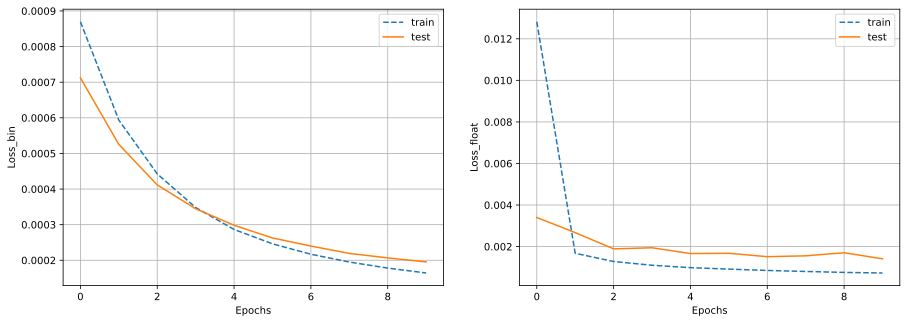

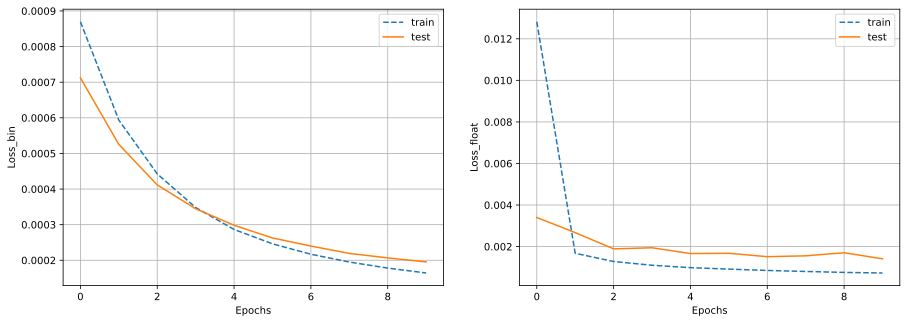

In [94]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = Model(400, 400, 10, 4, 4, d_model=32).to(device)

lr = 1e-4
epochs = 10

batch_size = 64
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

criterion_bin = torch.nn.BCEWithLogitsLoss()
criterion_float = torch.nn.MSELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

loaders = {'train': train_dataloader, 'test': test_dataloader}
losses_bin_test, losses_bin_train, losses_float_test, losses_float_train, TN_state = train_cycle(model, epochs, criterion_bin, criterion_float, optimizer, None, loaders, device)

In [95]:
torch.save(TN_state, 'TN_SWaT')
model.load_state_dict(torch.load('/content/TN_SWaT'))

<All keys matched successfully>

In [96]:
all = 0
for i in model.named_parameters():
  print(i[1].max())
  all += i[1].reshape(-1).shape[0]

print(all)

tensor(0.9900, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.3345, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.2028, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1572, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1177, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0957, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0039, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.8695, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0062, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.3325, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0062, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.1882, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0062, device='cuda:0', grad_fn=<MaxBack

In [97]:
r = []
g = []
x, y = test_dataset[0]
o = x
x = torch.Tensor(x).to(device)[None, :, :].double()
model.eval()
for i in range(1):
  _, y = test_dataset[i*10]
  result = model(x)
  #plt.plot(result[0, :, 0].cpu().detach(), label=f'{i}')
  #print(x.shape)
  result[:, :, -1][result[:, :, -1] < 0] = 0
  result[:, :, -1][result[:, :, -1] > 0] = 1

  x = torch.cat((x, result), dim=1)
  x = x[:, 10:, :]
  r.append(result.cpu().detach().numpy())
  g.append(y)

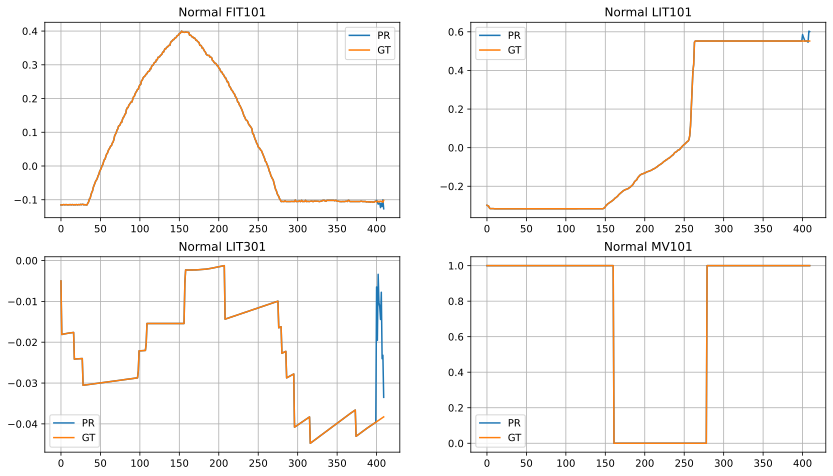

In [98]:
r = np.array(r)
g = np.array(g)

r = r.reshape(-1, 4)
g = g.reshape(-1, 4)

fig = plt.figure(figsize=(14, 12))
fig.add_subplot(3, 2, 1)
plt.plot([*o[:, 0], *r[:, 0]], label='PR')
plt.plot([*o[:, 0], *g[:, 0]], label='GT')
plt.title('Normal FIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 2)
plt.plot([*o[:, 1], *r[:, 1]], label='PR')
plt.plot([*o[:, 1], *g[:, 1]], label='GT')
plt.title('Normal LIT101')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 3)
plt.plot([*o[:, 2], *r[:, 2]], label='PR')
plt.plot([*o[:, 2], *g[:, 2]], label='GT')
plt.title('Normal LIT301')
plt.legend()
plt.grid()

fig.add_subplot(3, 2, 4)
plt.plot([*o[:, -1], *r[:, -1]], label='PR')
plt.plot([*o[:, -1], *g[:, -1]], label='GT')
plt.title('Normal MV101')
plt.legend()
plt.grid()

plt.show()